Сделайте копию ноутбука (файл => создать копию на диске). Переименуйте, добавив в название ФИО и номер группы


## Задание 2.1

### Теория

Звуковые волны оцифровываются путем выборки с заданной частотой дискретизации (как правило, 44,1 кГц то есть 44100 отчёта в секунду). Каждый отчёт представляет собой амплитуду волны. Для отчёта задаётся глубина в битах (или динамический диапазон сигнала). Эта величина определяет насколько детализированным будет отчёт (обычно 16 бит, т.е. семпл может варьироваться от 65 536 значений амплитуды).


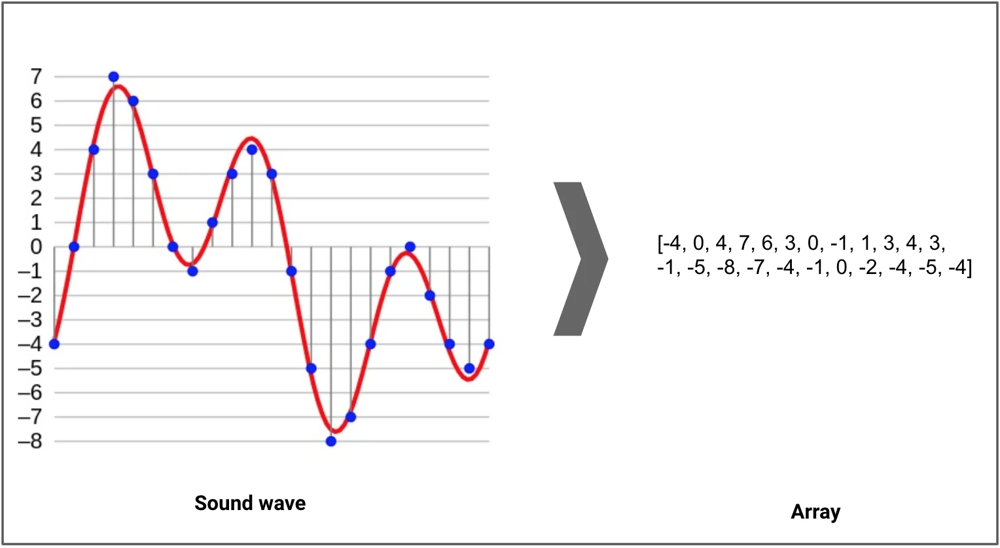

In [3]:
import librosa

In [4]:
filename = librosa.ex('trumpet')

In [5]:
y, sr = librosa.load(filename)

In [6]:
y

array([-1.4068224e-03, -4.4607223e-04, -4.1098078e-04, ...,
        7.9623060e-06, -3.0417003e-05,  1.2765067e-05], dtype=float32)

In [7]:
librosa.get_duration(y) # длительность в секундах

5.333378684807256

In [8]:
y.shape

(117601,)

In [9]:
sr

22050

Прочитали файл, в котором частота дискретизации 22050 kHz, и глубина звука 32 бита.

In [10]:
y, sr = librosa.load(filename, sr=11025) # здесь sr = 22050 по умолчанию

In [11]:
librosa.get_duration(y) 

2.6667120181405894

In [12]:
y.shape

(58801,)

In [13]:
import IPython.display as ipd

In [14]:
ipd.Audio(filename)

In [15]:
ipd.Audio(y,rate=22050)

In [16]:
ipd.Audio(y,rate=11025)

In [17]:
ipd.Audio(y[15000:-35000],rate=8000)

В библиотеке librosa есть и другие примеры звуков: https://librosa.org/doc/latest/recordings.html

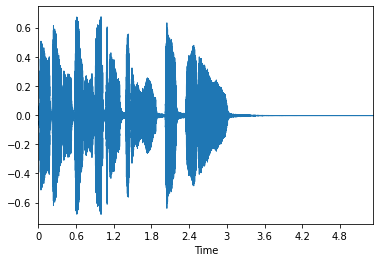

In [18]:
import librosa.display
librosa.display.waveplot (y, sr=sr)

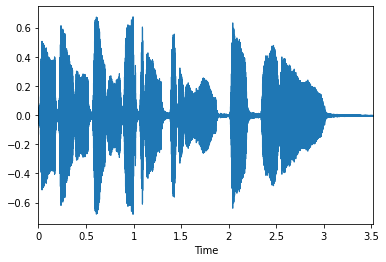

In [19]:
librosa.display.waveplot (y[:-20000], sr=sr)

In [20]:
import soundfile as sf

In [21]:
data, samplerate = sf.read(filename, dtype='int16')

In [22]:
data

array([-46, -15, -13, ...,   0,  -1,   0], dtype=int16)

In [23]:
samplerate

22050

### Формулировка задания

Прочитайте два аудиофайла: один из звуков в librosa, другой не из библиотеки (можно скачать по URL, или зработать с файлом прямо в колабе).

В этих файлах выделите фреймы размером по 240 отчётов.

Напишите алгоритм **равномерного скалярного квантования с постоянной скоростью**, выделив на каждый отчёт внутри фрейма по 8 бит. Примените алгорим к каждому аудио. 

Сравните исходный и восстановленный сигнал с помощью $RMSE$ и $PSNR$.

Напишите код, который воспроизводит исходный и восстановленный сигналы.

In [24]:
from urllib.request import urlopen
from io import BytesIO


down_file_link = "https://bigsoundbank.com/UPLOAD/wav/0852.wav"
libr_sound, libr_sr = sf.read(librosa.ex('nutcracker'), dtype = 'int16')
down_sound, down_sr = sf.read(BytesIO(urlopen(down_file_link).read()), dtype = 'int16')

In [25]:
libr_sound = libr_sound[:libr_sr * 15]
down_sound = down_sound[:down_sr * 15]

In [26]:
ipd.Audio(libr_sound, rate = libr_sr)

In [27]:
ipd.Audio(down_sound, rate = libr_sr)

In [28]:
import math
import numpy as np
frame = 240
step = 8

#алгоритм нахождения сжатой дорожки
def aproximation(data):
  n = len(data)
  aproximed_data = np.zeros(n)
  for i in range(0, n, frame):
    right_bor = min(i + 240, n)
    slave = data[i:  right_bor]
    seize = (slave.max() - slave.min()) / 2**step
    if seize == 0:
      seize = 1
    for j in range(right_bor - i):
      aproximed_data[j + i] = round(slave[j] / seize) * seize
  return aproximed_data

def restore(data):
  return data


#алгоритм нахождения RMSE
def rmse(con1, con2):
  l = len(con1)
  mse = np.sum((con1 - con2) ** 2) / l
  return np.sqrt(mse)


In [29]:
libr_apr = aproximation(libr_sound)
down_apr = aproximation(down_sound)

rmse1 = rmse(libr_sound, libr_apr)
rmse2 = rmse(down_sound, down_apr)

libr_max = max(libr_sound.max(), libr_apr.max())
down_max = max(down_sound.max(), down_apr.max())

print ("From Librosa Sound: RMSE: ", rmse1, "  PSNR: ", 20 * math.log10(libr_max/rmse1))
print ("My Sound RMSE: ", rmse2, "  PSNR: ", 20 * math.log10(down_max/rmse2))

From Librosa Sound: RMSE:  3.87307255630248   PSNR:  63.70291018854833
My Sound RMSE:  11.691124077257731   PSNR:  62.916416644040055


In [30]:
print("Восстановленный файл из либросы")
ipd.Audio(libr_apr, rate = libr_sr)

Восстановленный файл из либросы


In [31]:
print("Восстановленный мой файл")
ipd.Audio(down_apr, rate = down_sr)

Восстановленный мой файл


# Задание 2.2

### Теория

Линейное предсказание (linear prediction) — вычислительная процедура, позволяющая по некоторому набору предшествующих отсчётов цифрового сигнала предсказать текущий отсчёт.

Пусть $s(i)$ — анализируемый цифровой сигнал. При линейном предсказании оценка текущего отсчёта сигнала $\hat{s}(i)$ формируется как линейная комбинация предшествующих отсчётов:

$\hat{s}(i)=\sum_{k=1}^N \alpha_k s(i-k).$

Задача линейного предсказания заключается в том, чтобы найти набор коэффициентов $\{\alpha_k\}$, при котором средний квадрат ошибки предсказания минимален:

$<(s(i)-\hat{s}(i))^2>=min$.

Величина $N$ называется порядком линейного предсказания.

In [ ]:
y, sr = librosa.load(librosa.ex('trumpet'))

In [ ]:
librosa.lpc(y, 16)

array([ 1.        , -3.3483105 ,  5.577236  , -6.399646  ,  6.2586102 ,
       -5.7686753 ,  5.0466247 , -4.250743  ,  3.659012  , -3.1802912 ,
        2.7056537 , -2.1827636 ,  1.6752284 , -1.2272625 ,  0.83392584,
       -0.4313234 ,  0.12165806], dtype=float32)

In [ ]:
import numpy as np

In [ ]:
y, sr = librosa.load(librosa.ex('trumpet'), duration=0.020) # не весь сигнал, а только 0.02 секунды
a = librosa.lpc(y, 2) # коэффициенты фильтра 2-го порядка

In [ ]:
a

array([ 1.        , -1.8239224 ,  0.92526424], dtype=float32)

Для удобного получения предсказания применим следующую процедуру.

In [ ]:
b = np.hstack([[0], -1 * a[1:]]) # отрицательные коэффициенты (деноминатор)

In [ ]:
b

array([ 0.        ,  1.8239224 , -0.92526424])

In [ ]:
import scipy
y_hat = scipy.signal.lfilter(b, [1], y) # 1 - это нормировочный коэффициент

In [ ]:
y.shape == y_hat.shape

True

Размеры исходного сигнала и предсказанного совпадают.

Text(0.5, 1.0, 'LP Model Forward Prediction')

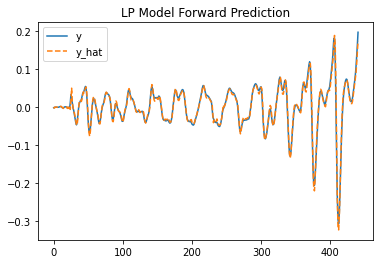

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.plot(y)
ax.plot(y_hat, linestyle='--')
ax.legend(['y', 'y_hat'])
ax.set_title('LP Model Forward Prediction')

На графике видно, что предсказание получилось достаточно точным. Но эту всё равно незначительные расхождения есть. Попробуем оценить эти расхождения.

Введём понятие ошибки предсказания: $e(i) = s(i)-\hat{s}(i) $. То есть $e(i)$ показывает разницу между исходным сигналом и его предсказанием.

### Пример

In [ ]:
y = np.matrix (y, dtype=float).T

In [ ]:
# Зададим матрицу A. здесь 100 - это количество обрабатываемых отчётов, а 10 - это порядок фильтра
A = np.matrix(np.zeros((100,10)))

In [ ]:
for m in range(0,100):
    A[m, :]=np.flipud(y[m + np.arange(10)]).T

In [ ]:
d = y[np.arange(10,110)] # это целевой сигнал (сдвигаем на порядок фильтра)

In [ ]:
h=np.linalg.inv(A.T*A) * A.T * d # формула для рассчёта коэффициентов предсказания
h

matrix([[ 2.0851458 ],
        [-1.72568346],
        [ 0.70635135],
        [-0.35285744],
        [ 0.3605411 ],
        [-0.33743517],
        [ 0.28769564],
        [-0.44589451],
        [ 0.45994536],
        [-0.2112565 ]])

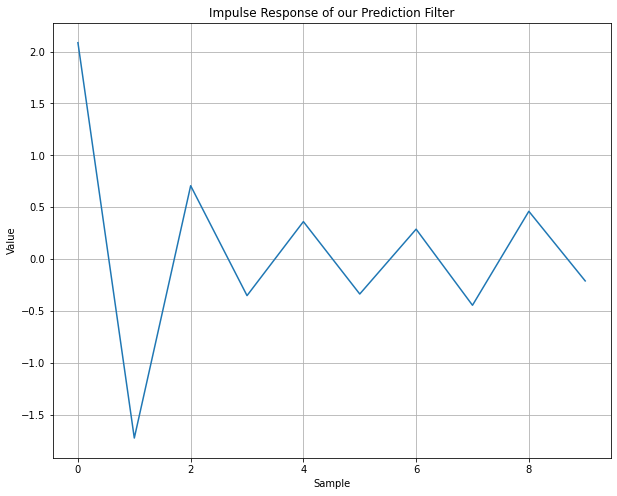

In [ ]:
plt.figure(figsize=(10,8))
plt.plot((h))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Impulse Response of our Prediction Filter')
plt.grid()

In [ ]:
hpred = np.vstack([0, (h)])
hpred

matrix([[ 0.        ],
        [ 2.0851458 ],
        [-1.72568346],
        [ 0.70635135],
        [-0.35285744],
        [ 0.3605411 ],
        [-0.33743517],
        [ 0.28769564],
        [-0.44589451],
        [ 0.45994536],
        [-0.2112565 ]])

In [ ]:
ypred = scipy.signal.lfilter(np.array(hpred.T)[0],1,np.array(y.T)[0])

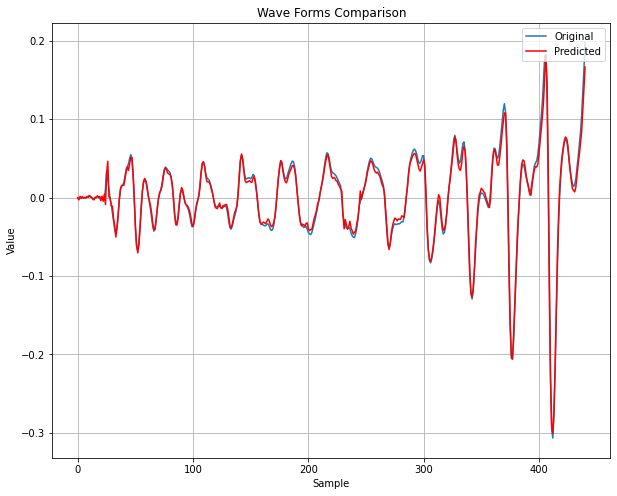

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(y);
plt.plot(ypred,'red')
plt.legend(('Original','Predicted'), loc='upper right')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Wave Forms Comparison')
plt.grid()

In [ ]:
hperr = np.vstack([1, -(h)])
e = scipy.signal.lfilter(np.array(hperr.T)[0],1,np.array(y.T)[0])
e = np.matrix(e)

In [ ]:
display(ipd.Audio(e, rate = sr ))

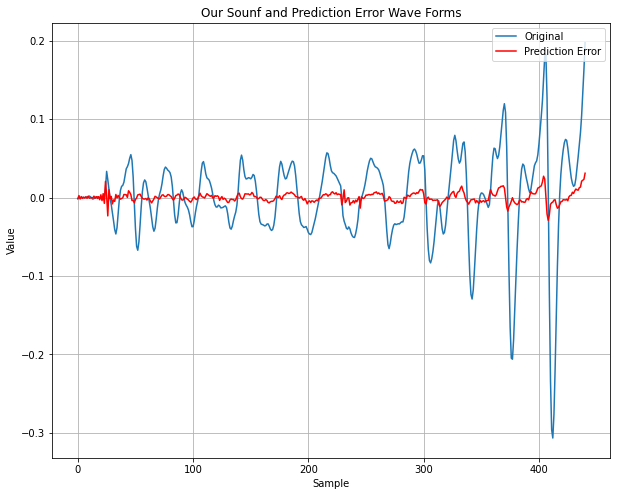

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(y)
plt.plot(e.T,'r')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Our Sounf and Prediction Error Wave Forms')
plt.legend(('Original', 'Prediction Error'), loc='upper right')
plt.grid()

Получим восстановленный сигнал

In [ ]:
yrec = scipy.signal.lfilter([1],np.array(hperr.T)[0], np.array(e)[0])

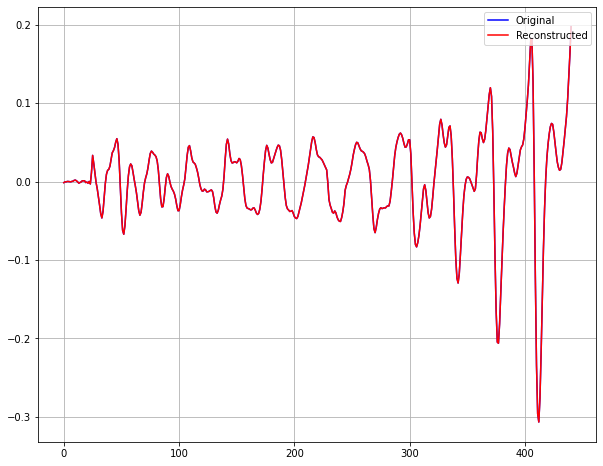

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(y,'b')
plt.plot(yrec,'r')
plt.legend(('Original', 'Reconstructed'), loc='upper right')
plt.grid()

Сигналы идеально совпали

## Формулировка задания

Работать нужно с теми же аудиофайлами, что и в задании 2.1.

Также нужно выделять фреймы размером по 240 отчётов.

Напишите алгоритм **равномерного скалярного квантования с переменной скоростью** для коэффициентов предсказания и для ошибок предсказания. У них разные шаги квантования! Примените алгоритм к каждому аудиофайлу. 

Сравните исходный и восстановленный сигнал с помощью $RMSE$ и $PSNR$.

Напишите код, который воспроизводит исходный и восстановленный сигналы.

Подберите наилучшие значения шага для квантования коэффициентов предсказания и для квантования ошибок предсказания. Наилучшими будем называть такие самые большие шаги, которые при этом не дают значительного ухудшения качества звука (просто на слух проверяйте)

Сравните результаты в задании 2.2 с результатами в задании 2.1. Кроме оценки ошибки сжатия может потребоваться оценка степени сжатия.

In [33]:
import scipy
frame = 240

#функция нахождения кватнованной последовательности
def aproximation(road, step):
  k = 10000
  aproximed_road = road  // step
  aproximed_road = (aproximed_road + 0.5) * step
  return aproximed_road


def rmse(con1, con2):
  l = len(con1)
  mse = np.sum((con1 - con2) ** 2) / l
  return np.sqrt(mse)

def predict(road, shift):
  ans1 = []
  ans2 = []
  road = np.matrix (road, dtype=float).T
  n = road.shape[0]

  for i in range(shift, n, frame):
    right_bor = min(i + 240 - shift, n - shift) 
    A = np.matrix(np.zeros((right_bor - i, shift)))
    d = road[np.arange(i, right_bor)]

    for j in range(i - shift, right_bor):
      A[j-i]=np.flipud(road[j + np.arange(shift)]).T

    h=np.linalg.inv(A.T*A) * A.T * d
    hpred = np.vstack([0, (h)])
    hpred = scipy.signal.lfilter(np.array(hpred.T)[0],1,np.array(road[i-shift: right_bor].T)[0])
    #print (len(ans1), len(ans2))
    ans1 = np.append(ans1, np.array(h)[:, 0])
    ans2 = np.append(ans2, np.array(hpred))
  return (ans1, ans2)


In [34]:
libr_h, libr_pred = predict(libr_sound, 5)
down_h, down_pred = predict(down_sound, 5)

0 0
5 240
10 480
15 720
20 960
25 1200
30 1440
35 1680
40 1920
45 2160
50 2400
55 2640
60 2880
65 3120
70 3360
75 3600
80 3840
85 4080
90 4320
95 4560
100 4800
105 5040
110 5280
115 5520
120 5760
125 6000
130 6240
135 6480
140 6720
145 6960
150 7200
155 7440
160 7680
165 7920
170 8160
175 8400
180 8640
185 8880
190 9120
195 9360
200 9600
205 9840
210 10080
215 10320
220 10560
225 10800
230 11040
235 11280
240 11520
245 11760
250 12000
255 12240
260 12480
265 12720
270 12960
275 13200
280 13440
285 13680
290 13920
295 14160
300 14400
305 14640
310 14880
315 15120
320 15360
325 15600
330 15840
335 16080
340 16320
345 16560
350 16800
355 17040
360 17280
365 17520
370 17760
375 18000
380 18240
385 18480
390 18720
395 18960
400 19200
405 19440
410 19680
415 19920
420 20160
425 20400
430 20640
435 20880
440 21120
445 21360
450 21600
455 21840
460 22080
465 22320
470 22560
475 22800
480 23040
485 23280
490 23520
495 23760
500 24000
505 24240
510 24480
515 24720
520 24960
525 25200
530 25440
5

KeyboardInterrupt: ignored

# Задание 2.3

## Теория

And Now for Something Completely Different

На лекции ещё будем это разбирать, так что пока просто код.

In [ ]:
sf.write('stereo_file.wav', np.random.randn(10, 2), 44100, 'PCM_16') # сохранение файла

In [ ]:
sr = 22050 # частота дискретизации
T = 3.0    # секунды
t = np.linspace(0, T, int(T*sr), endpoint=False) # переменная времени
x = 0.5*np.sin(16*np.pi*220*t) # чистая синусоидная волна при 220 Гц
# сохранение аудио
sf.write('tone_220.wav', x, sr, 'PCM_16')

In [ ]:
ipd.Audio(x, rate=sr) 

Построим спектрограмму сигнала

In [ ]:
cmap = plt.get_cmap('inferno')

(array([[7.07288557e-13, 8.86700718e-14, 7.18032929e-13, ...,
         2.74897680e-16, 8.01352955e-13, 6.50707676e-18],
        [1.41530581e-12, 1.77933384e-13, 1.43679688e-12, ...,
         1.12366753e-15, 1.60345529e-12, 5.86841783e-16],
        [1.41749380e-12, 1.79714868e-13, 1.43899201e-12, ...,
         2.84710561e-15, 1.60570389e-12, 2.31005340e-15],
        ...,
        [4.66082095e-19, 3.51629002e-18, 4.13115032e-19, ...,
         3.95146654e-18, 2.29899167e-21, 3.95423695e-18],
        [4.64625871e-19, 3.51529936e-18, 4.11625964e-19, ...,
         3.95204529e-18, 7.46348643e-22, 3.95176520e-18],
        [2.32070096e-19, 1.75748449e-18, 2.05586570e-19, ...,
         1.97521418e-18, 1.22295725e-22, 1.97634316e-18]]),
 array([0.00000000e+00, 9.76562500e-04, 1.95312500e-03, ...,
        9.98046875e-01, 9.99023438e-01, 1.00000000e+00]),
 array([  512.,  1472.,  2432.,  3392.,  4352.,  5312.,  6272.,  7232.,
         8192.,  9152., 10112., 11072., 12032., 12992., 13952., 14912.,
  

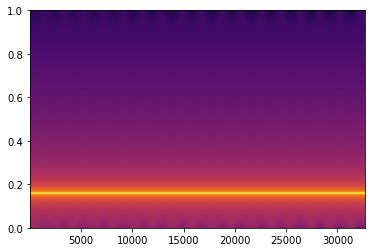

In [ ]:
plt.specgram(x, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB')

In [ ]:
filename = librosa.ex('nutcracker')

In [ ]:
y, sr = librosa.load(filename)

(array([[3.27778604e-20, 2.36053446e-19, 7.32467340e-20, ...,
         8.38508003e-18, 9.78520865e-18, 3.11127612e-18],
        [5.86582522e-20, 5.20197992e-19, 3.94855356e-19, ...,
         1.57933509e-17, 2.41780396e-17, 2.53462684e-18],
        [6.32694553e-20, 6.28798956e-21, 6.10505945e-20, ...,
         1.82094398e-16, 3.89841527e-17, 2.40244619e-18],
        ...,
        [7.20550919e-15, 5.19870928e-10, 3.24115740e-11, ...,
         1.11468116e-10, 1.27843148e-10, 7.51021002e-10],
        [3.26463347e-15, 1.25277538e-10, 5.17323177e-12, ...,
         1.07454717e-10, 6.34945976e-11, 1.43379612e-09],
        [6.82088766e-16, 8.06363554e-12, 7.15182850e-12, ...,
         8.56875955e-11, 2.01905574e-11, 8.60253255e-10]]),
 array([0.00000000e+00, 9.76562500e-04, 1.95312500e-03, ...,
        9.98046875e-01, 9.99023438e-01, 1.00000000e+00]),
 array([5.120000e+02, 1.472000e+03, 2.432000e+03, ..., 1.318592e+06,
        1.319552e+06, 1.320512e+06]),
 <matplotlib.image.AxesImage at 0x7f15e

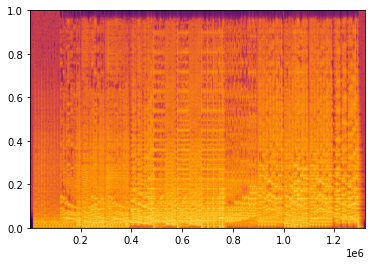

In [ ]:
plt.specgram(y, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB')

In [ ]:
ipd.Audio(y, rate=sr) 

## Формулировка задания

Сгенерируйте свой собственный музыкальный фрагмент.

Сохраните в формате wav. 

Постройте для него спектрограмму и прокомментируйте её.

Требования к фрагменту:
* длительность от 25 до 30 секунд;
* должна быть какая-то мелодия (не
обязательно очень красивая, но хотя бы такая, чтобы
из ушей не потекла кровь);
* звук генерируется как сумма синусоид на разной
частоте и с разной амплитудой;
* звук постепенно вступает, а в конце постепенно
затухает, (т.е. меняется громкость);
* обязательно нужно использовать фрагменты чужих
записей (они должны быть прочитаны из файла).

In [ ]:
# YOUR CODE HERE